## Computational Data Analysis {-}

## Course 02582 {-}

### Andreas Baum, andba@dtu.dk {-}

Required Python3 packages: *dill*, *numpy*, *scikit-learn*, *tensorly*, *matplotlib* 

# Background

Excitation-emission fluorescence spectroscopy is used in analytical chemistry to detect and quantify chemical constituents, e.g. amino acids. Such constituents typically absorb light in a certain spectral range (excitement) followed by the subsequent phenomena of light emission (fluorescence). Hereby, the emitted light may indicate different wavelengths than the light used for excitation.  

This provided data set consists of five simple laboratory-made samples. Each sample contains different amounts of tyrosine, tryptophan and phenylalanine dissolved in phosphate buffered water. The samples were measured by fluorescence (excitation 250-300 nm, emission 250-450 nm, 1 nm intervals) on a PE LS50B spectrofluorometer. The multiway array $\mathcal{X}$ to be decomposed is hence $5 \times 61 \times 201$. (Bro et al. 1997)

For further information about these data refer to: Bro, R, "PARAFAC: Tutorial and applications", *Chemometrics and Intelligent Laboratory Systems*, **1997**, 38, 149-171


# Questions

## Install all required Python3 packages (maybe you require upgrades)! Load pickled data (`Amino.pkl`) using dill!

This has been done for you already. The tensor $\mathcal{X}$ is stored in variable `x`. Amino acid concentrations of the three amino acids tryptophan, tyrosine and phenylalanine are stored in `amin_conc`. `scale_em` and `scale_ex` contain the axis labels for the emission and the excitation mode. The tensor $\mathcal{X}$ has three modes and its dimensionality is $5 \times 61 \times 201$.

In [1]:
import dill
dill.load_session('Data/Amino.pkl')

# concentrations of the three amino acids in the five samples 
amino_conc
colnames_amino = ['tryptophan', 'tyrosine', 'phenylalanine']

# axis labels for the emission and excitation mode
scale_em = emax
scale_ex = exax

# dimensionality of the tensor X is ...
print(x.shape)

(5, 61, 201)


## Visualize all 5 Excitation/Emission (EX/EM) profiles (= samples) using surface plots! Ideally these data should be describable with three PARAFAC components. Why?

**Hint**: You can find Python code on how to surface plot in the casein exercise.

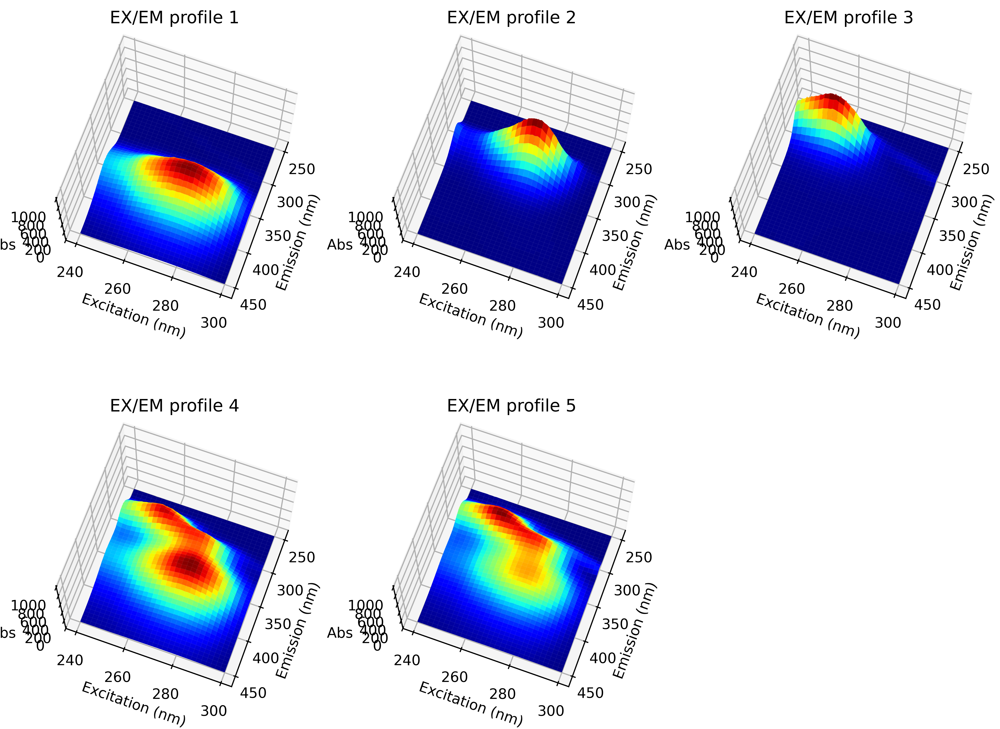

In [2]:
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

# define meaningful z-axis limits for all plots
maxx = x.max() + x.max()*0.1
minn = x.min() - x.min()*0.1

# prepare for surface plotting
angle1, angle2 = 70, 20
mesh = np.meshgrid(emax, exax)
fig = plt.figure(figsize=(12,9), dpi=600)

# surf plot all 5 EX/EM profiles (samples)
for sample in range(x.shape[0]):
    ax = fig.add_subplot(2, 3, sample+1, projection='3d')
    ax.plot_surface(*mesh, x[sample,:,:], cmap=cm.jet)
    ax.view_init(angle1, angle2)
    ax.set_zlim(bottom=minn, top=maxx)
    ax.set_ylabel('Excitation (nm)')
    ax.set_xlabel('Emission (nm)') 
    ax.set_zlabel('Abs')
    ax.set_title("EX/EM profile %s" % str(sample+1))

The factor landscapes above should be related with one of the three amino acids. That's why we could use three PARAFAC components to decribe the data.

## Decompose the three-way tensor using PARAFAC!

For the following assume the notation of the decomposition as $\mathcal{X} = A  (B \odot C)^T + \mathcal{E}$, where $\mathcal{X}$, $A$, $B$, $C$ and $\mathcal{E}$ represent the three-way tensor, PARAFAC scores (sample mode loadings), loadings for the emission and excitation mode and residuals, respectively, and $\odot$ represents the Khatri-Rao product.

In [3]:
from tensorly.decomposition import parafac
# Define number of components
numcomp = 3

# random state is set to reproduce solution handout results
model1 = parafac(x, numcomp, init='random', random_state=2020)
loadings = model1[1]

## Plot all PARAFAC mode loadings ($A$, $B$ and $C$)! How do these relate to the 5 EX/EM profiles above? 

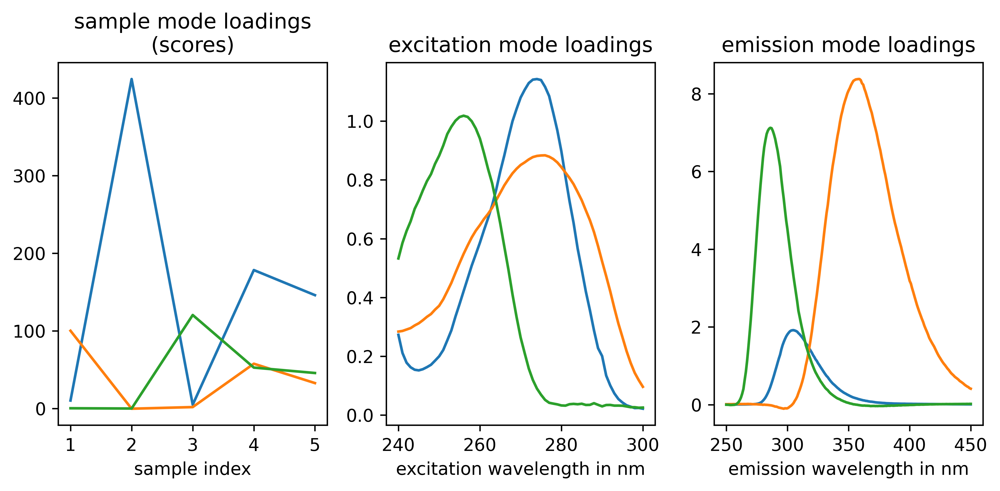

In [4]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(8,4), dpi=600)
ax[0].plot([1,2,3,4,5], loadings[0])
ax[0].set_title('sample mode loadings\n(scores)')
ax[0].set_xlabel('sample index')
ax[1].plot(exax[0,:], loadings[1]) 
ax[1].set_title('excitation mode loadings')
ax[1].set_xlabel('excitation wavelength in nm')
ax[2].plot(emax[0,:], loadings[2])
ax[2].set_title('emission mode loadings')
ax[2].set_xlabel('emission wavelength in nm')
plt.tight_layout()

These scores should describe how strong the individual amino acids are during the reaction. 

## Scatter plot the PARAFAC scores versus the appropriate known amino acid concentrations! 

**Hint**: You are expected to obtain three scatter plots here, one for each amino acid.

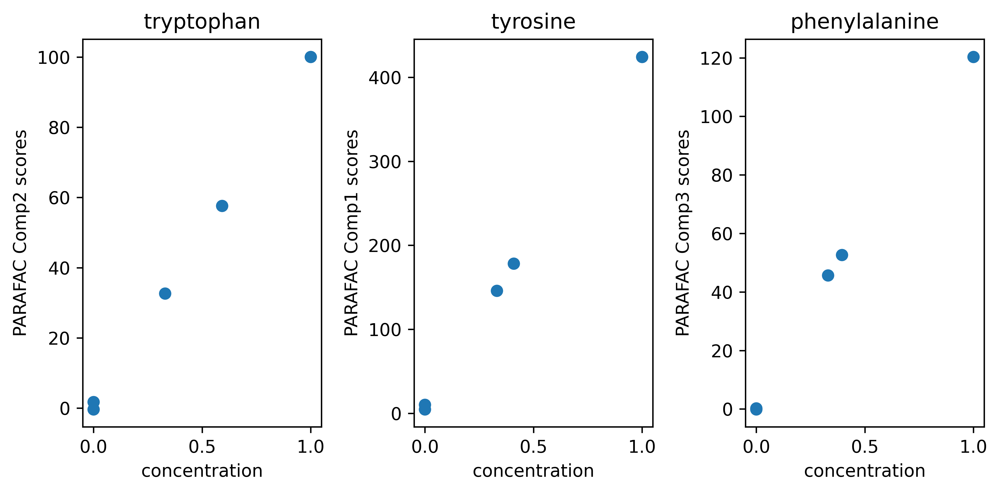

In [5]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(8,4), dpi=600)
ax[0].scatter(amino_conc[:,0] / amino_conc[:,0].max(), loadings[0][:,1])
ax[0].set_title(colnames_amino[0])
ax[0].set_xlabel('concentration')
ax[0].set_ylabel('PARAFAC Comp2 scores')
ax[1].scatter(amino_conc[:,1] / amino_conc[:,1].max(), loadings[0][:,0])
ax[1].set_title(colnames_amino[1])
ax[1].set_xlabel('concentration')
ax[1].set_ylabel('PARAFAC Comp1 scores')
ax[2].scatter(amino_conc[:,2] / amino_conc[:,2].max(), loadings[0][:,2])
ax[2].set_title(colnames_amino[2])
ax[2].set_xlabel('concentration')
ax[2].set_ylabel('PARAFAC Comp3 scores')
plt.tight_layout()

We can see high correlation for the three amino acid.

## Compute the outer vector products $b_ic_i^T$ for all PARAFAC components $1, 2, ..., I$  and surface plot the result!

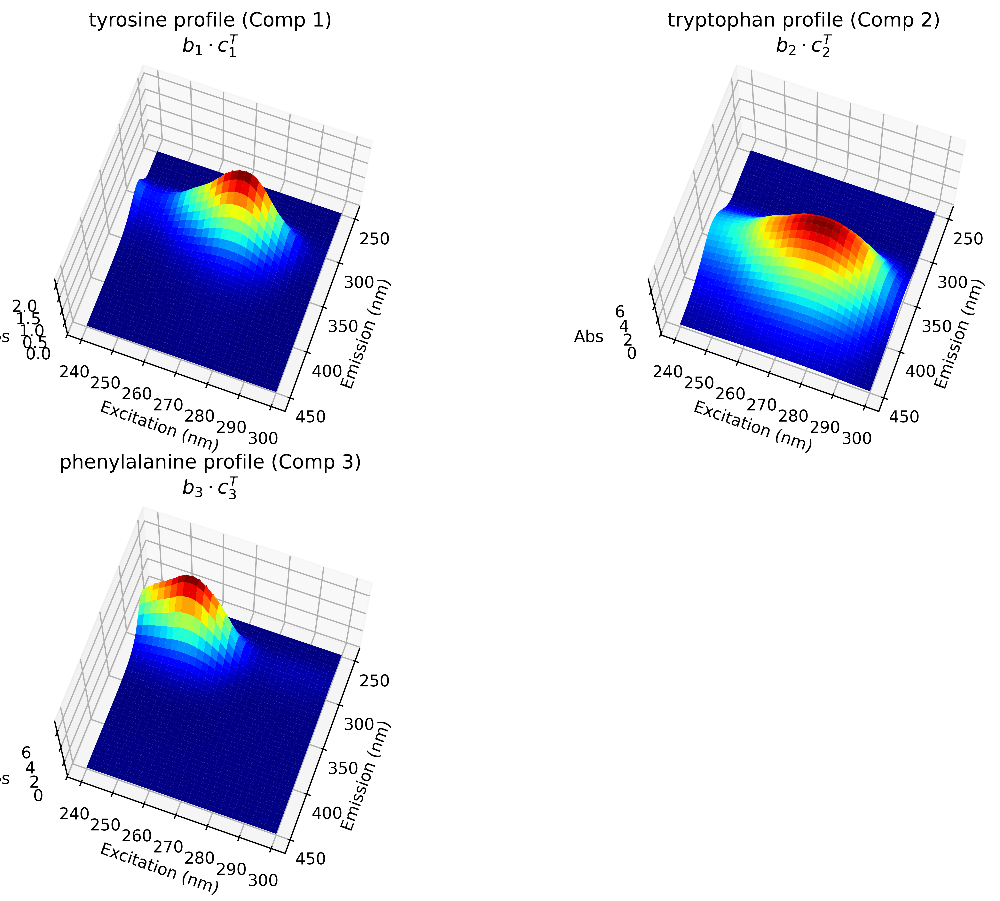

In [6]:
fig = plt.figure(figsize=(12,9), dpi=600)
aminos_reordered = [colnames_amino[1], colnames_amino[0], colnames_amino[2]]
for comp in range(numcomp):
    outerprod = (loadings[1][:,comp:comp+1]).dot(loadings[2][:,comp:comp+1].T)
    ax = fig.add_subplot(2, 2, comp+1, projection='3d')
    ax.plot_surface(*mesh, outerprod, cmap=cm.jet)
    ax.view_init(angle1,angle2)
    ax.set_ylabel('Excitation (nm)')
    ax.set_xlabel('Emission (nm)') 
    ax.set_zlabel('Abs')
    ax.set_title('%s profile (Comp %d)\n$b_%d \\cdot c_%d^T$' 
                 % (aminos_reordered[comp], comp+1, comp+1, comp+1))
    

## Reconstruct the 5th EX/EM profile using the PARAFAC model and surface plot the result!

Text(0.5, 0.92, 'PARAFAC reconstruction sample 5')

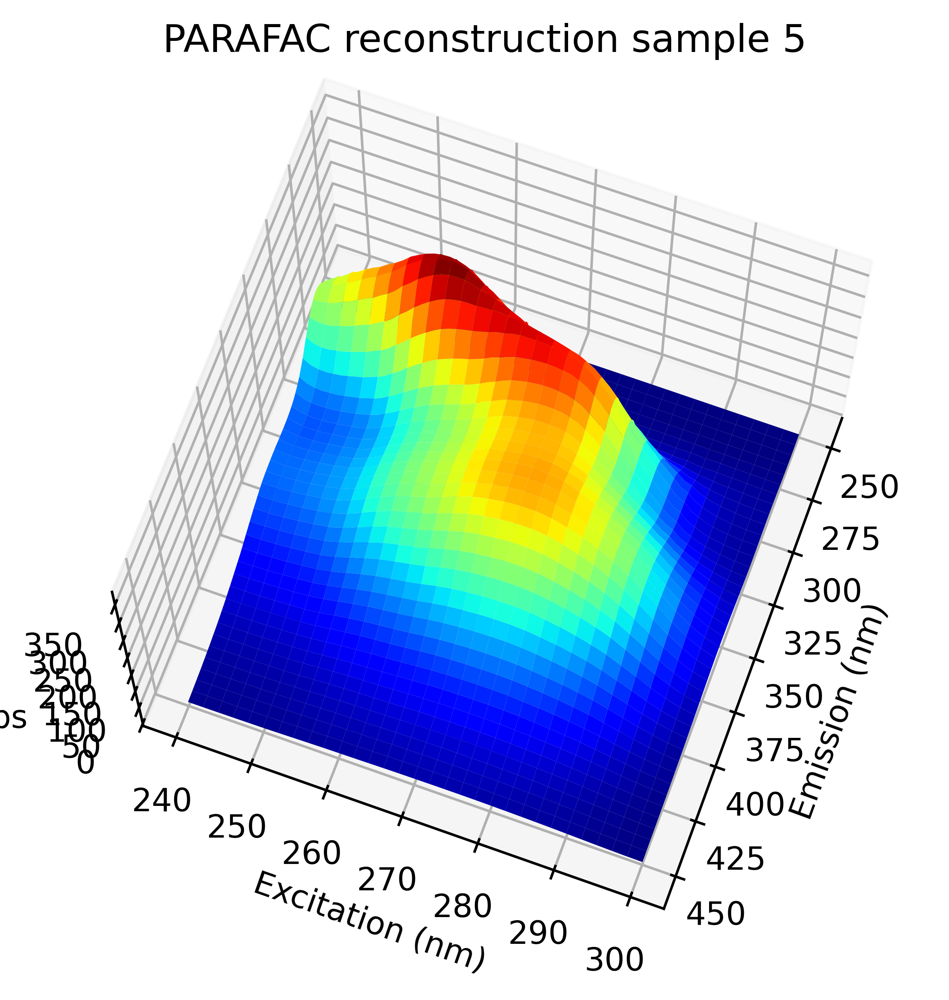

In [9]:
# reconstruct sample 5 from PARAFAC model
sample = 4
a = loadings[0]
b = loadings[1]
c = loadings[2]

## this can be done in three ways (A, B and C)
# A) Using Khatri-Rao formula
from tensorly.tenalg import khatri_rao
from tensorly import fold
recon1 = fold(a.dot((khatri_rao((b,c))).T), mode=0, shape=x.shape)[sample,:,:]

# B) as linear combination of outer vector products (scaled by respective scores)
recon = a[sample,0]*b[:,0:1].dot(c[:,0:1].T) + a[sample,1]*b[:,1:2].dot(c[:,1:2].T) + a[sample,2]*b[:,2:3].dot(c[:,2:3].T)

# C) simply apply kruskal_tensor function
from tensorly.cp_tensor import cp_to_tensor
recon = cp_to_tensor(model1)[sample,:,:]

# surface plot reconstructed sample
fig = plt.figure(figsize=(5,5), dpi=600)
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.plot_surface(*mesh, recon1, cmap=cm.jet)
ax.view_init(angle1, angle2)
ax.set_ylabel('Excitation (nm)')
ax.set_xlabel('Emission (nm)') 
ax.set_zlabel('Abs')
ax.set_title('PARAFAC reconstruction sample %s' % str(sample+1))



## Reconstruct the 5th sample using the PARAFAC model, but remove the tyrosine signals! Surface plot the result!

Text(0.5, 0.92, 'PARAFAC reconstruction sample 5 without Tyr signals')

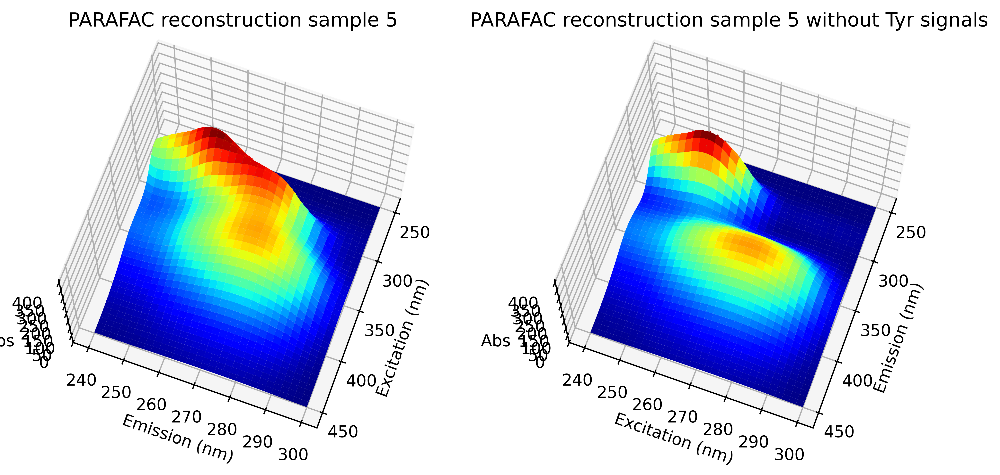

In [8]:
# reconstruct sample 5 from PARAFAC model without Tyr signals
# as linear combination of outer vector products, but remove tyr component!
recon2 = a[sample,1]*b[:,1:2].dot(c[:,1:2].T) + a[sample,2]*b[:,2:3].dot(c[:,2:3].T)

# define meaningful z-axis limits for all plots
maxx = recon1.max() + recon1.max()*0.1
minn = recon1.min() - recon1.min()*0.1

# surface plot recon1
fig = plt.figure(figsize=(10,5), dpi=600)
ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.plot_surface(*mesh, recon1, cmap=cm.jet)
ax.view_init(angle1, angle2)
ax.set_zlim(bottom=minn, top=maxx)
ax.set_xlabel('Excitation (nm)')
ax.set_ylabel('Emission (nm)') 
ax.set_zlabel('Abs')
ax.set_title('PARAFAC reconstruction sample %s' % str(sample+1))

# surface plot recon2
ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.plot_surface(*mesh, recon2, cmap=cm.jet)
ax.view_init(angle1, angle2)
ax.set_zlim(bottom=minn, top=maxx)
ax.set_ylabel('Excitation (nm)')
ax.set_xlabel('Emission (nm)') 
ax.set_zlabel('Abs')
ax.set_title('PARAFAC reconstruction sample %s without Tyr signals' % str(sample+1))


## (Optional) Compute the core tensor, such that $\mathcal{G} = \mathcal{X} \times_1 A^{-1} \times_2 B^{-1} \times_3 C^{-1}$. 

**Hint**: Use the function `multi_mode_dot` for sequential calculation of n-mode products.

In [4]:
from tensorly.tenalg import multi_mode_dot

## (Optional) Calculate the core consistency diagnostic (corcondia - CCD), such that $CCD = 100 \cdot (1 - \frac{||\mathcal{I} - \mathcal{G}||_F^2}{||\mathcal{I}||_F^2})$)! What is the purpose of the CCD? 

**Hint**: $\mathcal{I}$ represents a perfect super-diagonal core tensor, i.e. it contains ones along its diagonal and zeros otherwise.

## (Optional) Unfold the data and perform PCA! Can three PCA components resolve the three amino acids? Does PCA yield a unique solution?

PCA was performed for you already!

In [5]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from tensorly import unfold

# Unfold, mean-center and perform PCA
x_unfold = unfold(x, mode=0)
scaler1 = StandardScaler(with_mean=True, with_std=False)
model2 = PCA(numcomp)
pca_scores = model2.fit_transform(scaler1.fit_transform(x_unfold))